# **Group Assignment** - Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season (1:springer, 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

## PART I: Exploratory Data Analysis

In [522]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import datetime

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from itertools import product

from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import  mean_squared_error, r2_score, mean_absolute_error
from sklearn.utils.validation import column_or_1d

In [5]:
data = pd.read_csv('bike-sharing_hourly.csv')

In [291]:
data.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,...,casual,registered,cnt,hr_str,Datetime,DayofWeek,day_time,ad_hum,ad_wind,ad_temp
dteday,,,,,,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,0,6,0,1,9.84,...,3,13,16,0:00:00,2011-01-01 00:00:00,Saturday,Night,1,1,1
2011-01-01,2,1,0,1,1,0,6,0,1,9.02,...,8,32,40,1:00:00,2011-01-01 01:00:00,Saturday,Night,1,1,1
2011-01-01,3,1,0,1,2,0,6,0,1,9.02,...,5,27,32,2:00:00,2011-01-01 02:00:00,Saturday,Night,1,1,1
2011-01-01,4,1,0,1,3,0,6,0,1,9.84,...,3,10,13,3:00:00,2011-01-01 03:00:00,Saturday,Night,1,1,1
2011-01-01,5,1,0,1,4,0,6,0,1,9.84,...,0,1,1,4:00:00,2011-01-01 04:00:00,Saturday,Night,1,1,1


In [7]:
profile = ProfileReport(data, title="Bikes Data Report")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Outliers are in casual, registered and count. However, count is the target variable and casual and registered have high correlation with it. This is because casual and registered make up count. Therefore it cannot be included in the later model and the outliers do not matter.

#### Data does not contain nulls

### Rescaling of temp, atemp, windspeed, hum to make the variables more understandable

In [290]:
data['temp'] = data['temp'] * 41
data['atemp'] = data['atemp'] * 50
data['hum'] = data['hum'] * 100
data['windspeed'] = data['windspeed'] * 67

## Registered and casual users

In [9]:
df_daily = data.groupby(by = 'dteday').sum().reset_index()
df_daily['MA20_casual'] = df_daily.casual.rolling(20).mean()
df_daily['MA20_registered'] = df_daily.registered.rolling(20).mean()

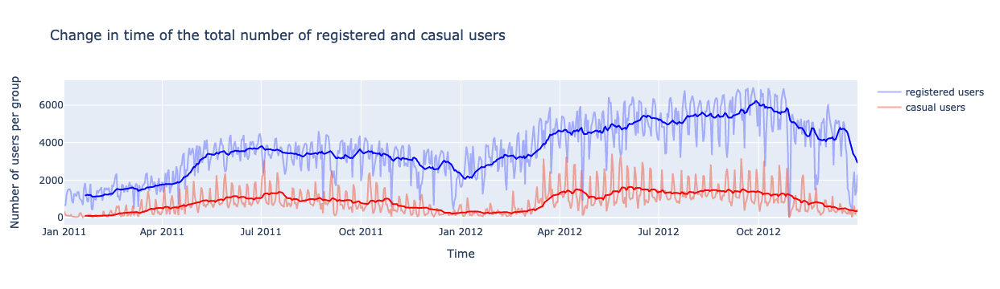

In [18]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_daily.dteday, y=df_daily['registered'],
                    mode='lines',
                    name='registered users', opacity = 0.5))
fig.add_trace(go.Scatter(x=df_daily.dteday, y=df_daily['casual'],
                    mode='lines',
                    name='casual users', opacity = 0.5))

fig.add_trace(go.Scatter(x=df_daily.dteday, y=df_daily['MA20_casual'], line_color = 'red',
                    mode='lines', name='casual MA',showlegend = False))
fig.add_trace(go.Scatter(x=df_daily.dteday, y=df_daily['MA20_registered'],line_color='blue',
                         mode='lines',showlegend = False)
             )

fig.update_layout(
    title='Change in time of the total number of registered and casual users',
    xaxis_title = 'Time',
    yaxis_title ='Number of users per group'
)
fig.show()

#### From the graph it can be noticed that both the number of registered and casual users fluctuate regularly which could be attributed to for example variable workingday. But when look at the moving average the trend of both groups is quite consistent and the total number of users seems to be increasing overtime with slight dip at the end.

In [20]:
data['hr_str'] = data.hr.astype(str) + ":00:00"

In [21]:
data['Datetime'] = data['dteday'] +' ' + data['hr_str']

In [22]:
data['Datetime'] = pd.to_datetime(data['Datetime'] )

In [24]:
df_group_hour = data.groupby(by = 'hr').mean().reset_index()
df_group_hour['hr_str'] = df_group_hour.hr.astype(str) + ":00:00"

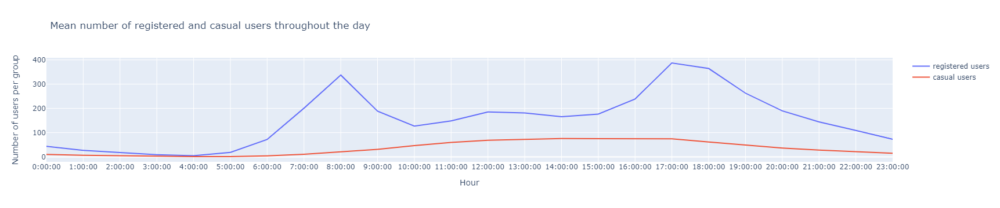

In [28]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_group_hour.hr_str, y=df_group_hour['registered'],
                    mode='lines',
                    name='registered users'))

fig.add_trace(go.Scatter(x=df_group_hour.hr_str, y=df_group_hour['casual'],
                    mode='lines',
                    name='casual users'))
fig.update_layout(
    title='Mean number of registered and casual users throughout the day',
    xaxis_title = 'Hour',
    yaxis_title ='Number of users per group'
)
fig.show()

#### This is a graph of mean number of regisered and casual users throughout the day. There are clear peaks in registered users in the morning and in the afternoon/evening. This makes sense as registered users use bikes more often which may indicate they use it to get to work. In this case hours shown on graph show clear sign of bikes usage in times of before and after work. This information can be transformed into a seperate variable indicating the time of the day.

In [29]:
data.set_index('dteday', inplace=True)

In [30]:
data['DayofWeek'] = data['weekday'].replace({1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday', 0: 'Sunday'})

In [31]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

Day_of_week = ['Monday','Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for i in Day_of_week:
    globals()['data_' + str(i)] = data[data['DayofWeek']==i].groupby(by='hr').mean().reset_index()
    globals()['data_' + str(i)]['hr_str'] = globals()['data_' + str(i)].hr.astype(str) + ':00:00'

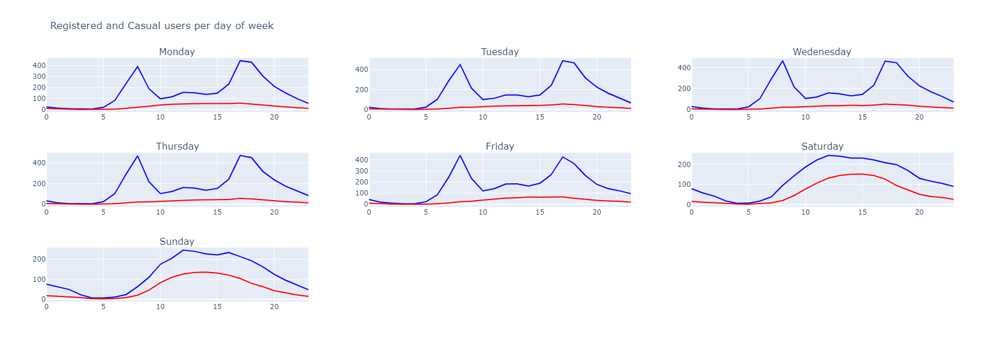

In [33]:
fig = make_subplots(rows=3, cols=3,subplot_titles=("Monday", "Tuesday", "Wedenesday", "Thursday", "Friday", "Saturday", "Sunday"))

fig.add_trace(
    go.Scatter(x=data_Monday.hr, y=data_Monday['registered'], showlegend = False, text = "Monday", line_color='blue'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=data_Monday.hr, y=data_Monday['casual'], showlegend = False, text = "Monday", line_color='red'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=data_Tuesday.hr, y=data_Tuesday['registered'], showlegend = False, line_color='blue'),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=data_Tuesday.hr, y=data_Tuesday['casual'], showlegend = False, line_color='red'),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=data_Wednesday.hr, y=data_Wednesday['registered'], showlegend = False, line_color='blue'),
    row=1, col=3
)

fig.add_trace(
    go.Scatter(x=data_Wednesday.hr, y=data_Wednesday['casual'], showlegend = False, line_color='red'),
    row=1, col=3
)


fig.add_trace(
    go.Scatter(x=data_Thursday.hr, y=data_Thursday['registered'], showlegend = False, line_color='blue'),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=data_Thursday.hr, y=data_Thursday['casual'], showlegend = False, line_color='red'),
    row=2, col=1
)


fig.add_trace(
    go.Scatter(x=data_Friday.hr, y=data_Friday['registered'], showlegend = False, line_color='blue'),
    row=2, col=2
)

fig.add_trace(
    go.Scatter(x=data_Friday.hr, y=data_Friday['casual'], showlegend = False, line_color='red'),
    row=2, col=2
)


fig.add_trace(
    go.Scatter(x=data_Saturday.hr, y=data_Saturday['registered'], showlegend = False, line_color='blue'),
    row=2, col=3
)

fig.add_trace(
    go.Scatter(x=data_Saturday.hr, y=data_Saturday['casual'], showlegend = False, line_color='red'),
    row=2, col=3
)


fig.add_trace(
    go.Scatter(x=data_Sunday.hr, y=data_Sunday['registered'], showlegend = False, line_color='blue'),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=data_Sunday.hr, y=data_Sunday['casual'], showlegend = False, line_color='red'),
    row=3, col=1
)

#names = {'Plot 1':'2016', 'Plot 2':'2017', 'Plot 3':'2018', 'Plot 4':'2019'}

# fig.for_each_annotation(lambda a: a.update(text = names[a.text]))

#fig.for_each_annotation(lambda a: a.update(text = a.text + ': ' + names[a.text]))
         
fig.update_layout(height=600, width=800, title_text="Registered and Casual users per day of week")


####  We can see that the previously described trend occrus during working days which would confirm the theory that there is a pattern in bike usage. Therefore based on the peak hours of bike usage during the week we added a time of day variable.

In [34]:
def day_time(data):
    
    if data['hr'] >= 6 and data['hr']<=10:
        val='Morning'
    elif data['hr'] > 10 and data['hr'] < 16: 
        val='Afternoon'
    elif data['hr'] >= 16 and data['hr'] <=20:
        val='Evening'
    elif (data['hr'] > 20 and data['hr'] <= 23) or (data['hr']>=0 and data['hr']<6):
        val='Night'
       
    return val

In [35]:
data['day_time'] = data.apply(day_time, axis=1)

## Analysis of humidity, wind speed and temperature to the count of users

In [292]:
aggr_hum = data.groupby('hum', as_index=False).sum()

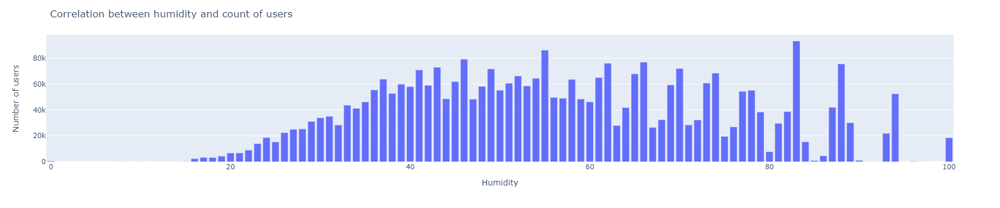

In [293]:
fig = px.bar(aggr_hum, x='hum', y='cnt')
fig.update_layout(
    title='Correlation between humidity and count of users',
    xaxis_title = 'Humidity',
    yaxis_title ='Number of users'
)
fig.show()

### Humidity follows a trend present in weather features. This trend is that too high or too low values cause the number of users to drop. On the higher end of the scale there are some outliers but the number of users is relatively smaller compared to the middle of the graph.

In [294]:
aggr_hum_avg = data.groupby('hum', as_index=False).count()

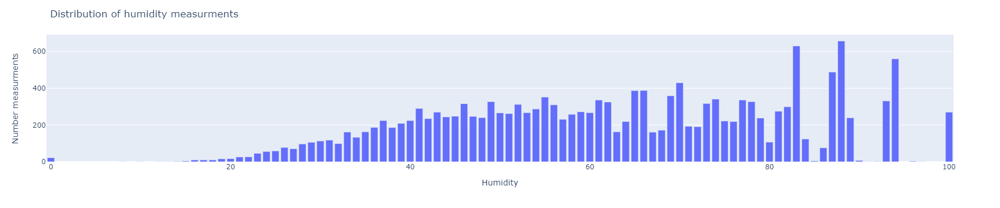

In [295]:
fig = px.bar(aggr_hum_avg, x='hum', y='cnt')
fig.update_layout(
    title='Distribution of humidity measurments',
    xaxis_title = 'Humidity',
    yaxis_title ='Number measurments'
)
fig.show()

### The two distributions of humidity look similar, however in the sum of users we can see the middle is significantly larger than in count of ocurrences. This would indicate that humidity may explain user behaviour.

In [296]:
aggr_wind = data.groupby('windspeed', as_index=False).sum()

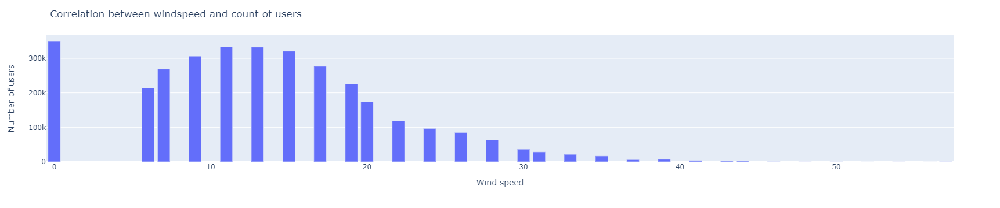

In [297]:
fig = px.bar(aggr_wind, x='windspeed', y='cnt')
fig.update_layout(
    title='Correlation between windspeed and count of users',
    xaxis_title = 'Wind speed',
    yaxis_title ='Number of users'
)
fig.show()

### The number of users per wind speed measure follows a similar pattern as other weather indicators. However in this case the only too high values of wind speed cause user decrease is too high, as 0 wind speed means that there is no wind.

In [298]:
aggr_wind_avg = data.groupby('windspeed', as_index=False).count()

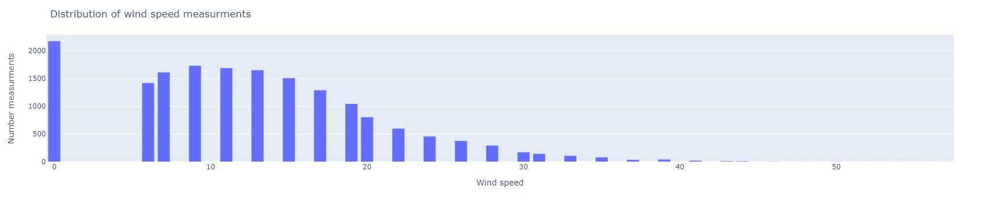

In [299]:
fig = px.bar(aggr_wind_avg, x='windspeed', y='cnt')
fig.update_layout(
    title='Distribution of wind speed measurments',
    xaxis_title = 'Wind speed',
    yaxis_title ='Number measurments'
)
fig.show()

### When the wind speed distribution at first it is not very clear if wind speed may explain user behaviour, but when looking around 10 wind speed mark it can be notice that the count of wind speed measurements is a bit flater which would indicate people using bikes more when wind is around that mark.

In [300]:
aggr_temp = data.groupby('temp', as_index=False).sum()

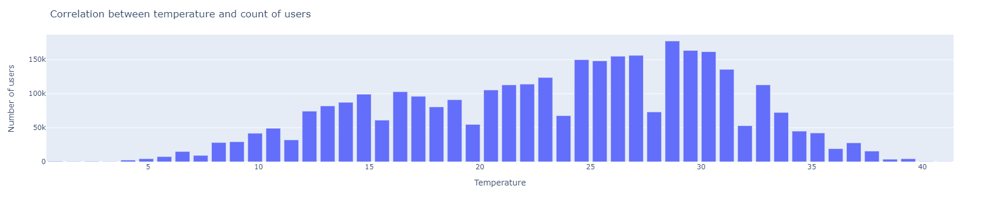

In [301]:
fig = px.bar(aggr_temp, x='temp', y='cnt')
fig.update_layout(
    title='Correlation between temperature and count of users',
    xaxis_title = 'Temperature',
    yaxis_title ='Number of users'
)
fig.show()

In [302]:
aggr_temp_avg = data.groupby('temp', as_index=False).count()

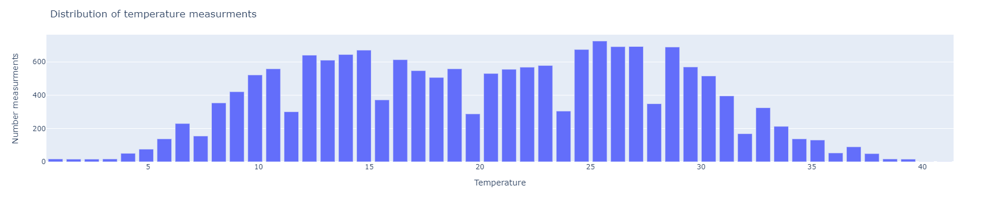

In [303]:
fig = px.bar(aggr_temp_avg, x='temp', y='cnt')
fig.update_layout(
    title='Distribution of temperature measurments',
    xaxis_title = 'Temperature',
    yaxis_title ='Number measurments'
)
fig.show()

### This graphs purpose is to see wether the temperature reall has an effect on the number of users. And this is true as the two distribution are slightly different with the one showing the sum of users having right side slightly larger. this would make sense as more people may go out when the temperature is higher.

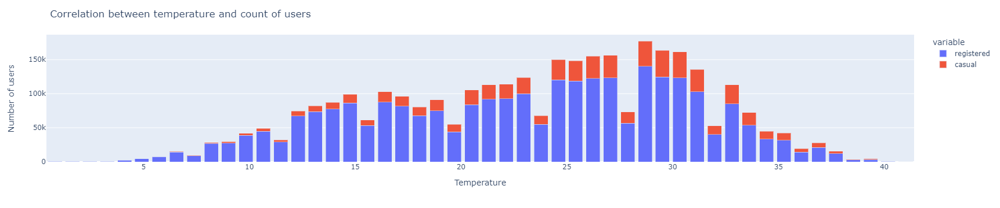

In [326]:
fig = px.bar(aggr_temp, x='temp', y=['registered','casual'], barmode='stack')
fig.update_layout(
    title='Correlation between temperature and count of users',
    xaxis_title = 'Temperature',
    yaxis_title ='Number of users'
)
fig.show()

In [327]:
aggr_temp['casual_portion'] = aggr_temp['casual'] / aggr_temp['cnt']
aggr_temp['registered_portion'] = aggr_temp['registered'] / aggr_temp['cnt']

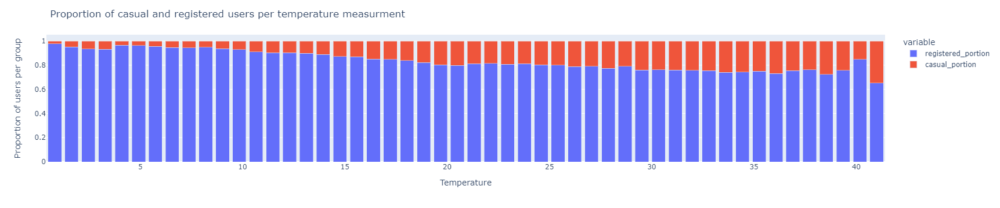

In [328]:
fig = px.bar(aggr_temp, x='temp', y=['registered_portion', 'casual_portion'], barmode="stack")
fig.update_layout(
    title='Proportion of casual and registered users per temperature measurment',
    xaxis_title = 'Temperature',
    yaxis_title ='Proportion of users per group'
)
fig.show()

### The stacked bar chart of temperature of users suggest a difference in behaviour between the two groups of users. As with the temperature growing the proportion of casual users grows.

In [304]:
aggr_atemp = data.groupby('atemp', as_index=False).sum()

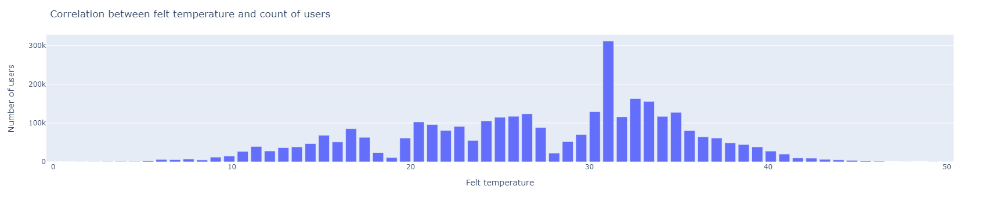

In [305]:
fig = px.bar(aggr_atemp, x='atemp', y='cnt')
fig.update_layout(
    title='Correlation between felt temperature and count of users',
    xaxis_title = 'Felt temperature',
    yaxis_title ='Number of users'
)
fig.show()

In [306]:
aggr_atemp_avg = data.groupby('atemp', as_index=False).count()

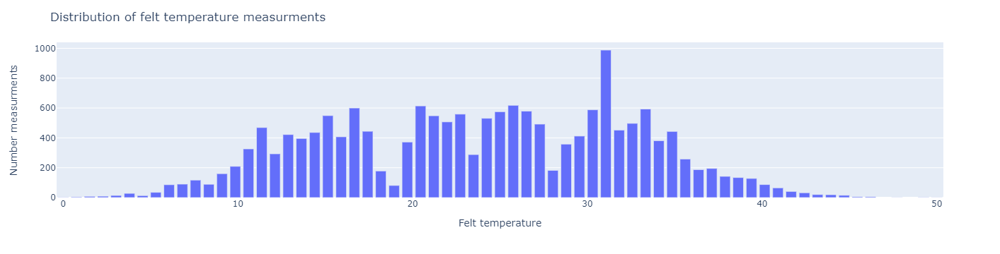

In [307]:
fig = px.bar(aggr_atemp_avg, x='atemp', y='cnt')
fig.update_layout(
    title='Distribution of felt temperature measurments',
    xaxis_title = 'Felt temperature',
    yaxis_title ='Number measurments'
)
fig.show()

### In all three variables: humidity, wind speed and temperature, there is a clear pattern which shows that if any of these variables is too high or too low, the number of users will drop a lot. Therefore in the following step three new features will be created which will indicate if the feature is adequate (meaning in the desired range by users) = 1, if it will be too low or too high = 0. Atemp will not receive a new variable here as it will be discussed in correlation analysis of numerical features, and subsquently will be removed from the final model.

In [192]:
def ad_hum(data):
  
    if data['hum'] >= 0.2 or data['hum'] <= 0.88:
        return 1
    else:
        return 0

In [193]:
data['ad_hum'] = data.apply(ad_hum, axis=1)

In [198]:
def ad_wind(data):
  
    if data['windspeed'] <= 0.42:
        return 1
    else:
        return 0

In [199]:
data['ad_wind'] = data.apply(ad_wind, axis=1)

In [201]:
def ad_temp(data):
  
    if data['temp'] >= 0.2 or data['temp'] <= 0.86:
        return 1
    else:
        return 0

In [202]:
data['ad_temp'] = data.apply(ad_temp, axis=1)

## Analysis of users per month and season

### During initial analysis we noticed that seasons were incorrectly assigned, for example January and February wre in Spring. To fix that we used function below to assign correct seasons.

In [214]:
def seasons(data):
  
    if data['mnth'] == 12 or data['mnth'] == 1 or data['mnth'] == 2:
        return 1
    elif data['mnth'] == 3 or data['mnth'] == 4 or data['mnth'] == 5: 
        return 2
    elif data['mnth'] == 6 or data['mnth'] == 7 or data['mnth'] == 8:
        return 3
    elif data['mnth'] == 9 or data['mnth'] == 10 or data['mnth'] == 11:
        return 4

In [215]:
data['season'] = data.apply(seasons, axis=1)

In [204]:
aggr_m = data.groupby(by = ['mnth'], as_index=False).sum()

In [205]:
season_names = ['Winter', 'Winter', 'Spring', 'Spring', 'Spring', 'Summer', 'Summer','Summer', 'Fall', 'Fall', 'Fall', 'Winter']

In [206]:
aggr['season_names'] = season_names

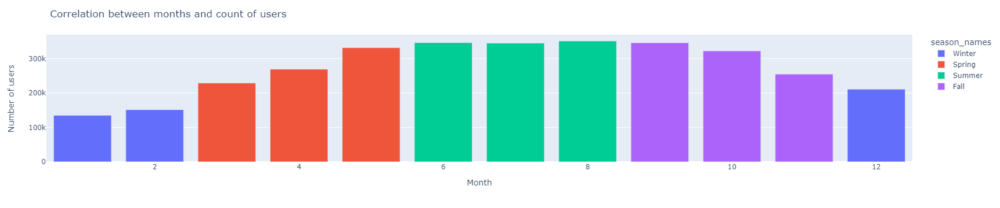

In [208]:
fig = px.bar(aggr, x='mnth', y='cnt', color='season_names')
fig.update_layout(
    title='Correlation between months and count of users',
    xaxis_title = 'Month',
    yaxis_title ='Number of users'
)
fig.show()

In [217]:
aggr_s = data.groupby('season', as_index=False).sum()

In [219]:
season_names2 = ['Winter', 'Spring', 'Summer', 'Fall',]
aggr_s['season_names'] = season_names2

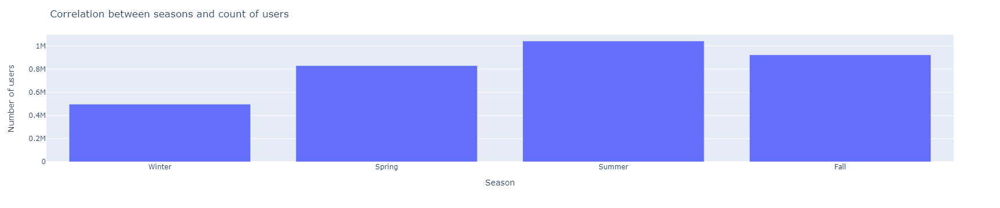

In [222]:
fig = px.bar(aggr_s, x='season_names', y='cnt')
fig.update_layout(
    title='Correlation between seasons and count of users',
    xaxis_title = 'Season',
    yaxis_title ='Number of users'
)
fig.show()

### From both graphs we can clearly notice that summer months have the most users from all seasons.

In [313]:
aggr_season = data.groupby('season', as_index=False).sum()

In [314]:
aggr_season['casual_portion'] = aggr_season['casual'] / aggr_season['cnt']

In [315]:
aggr_season['registered_portion'] = aggr_season['registered'] / aggr_season['cnt']

In [321]:
aggr_season['season'] = season_names2

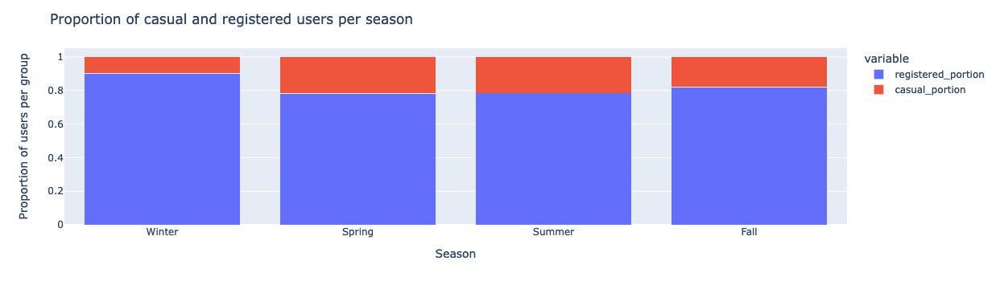

In [322]:
fig = px.bar(aggr_season, x='season', y=['registered_portion', 'casual_portion'], barmode="stack")
fig.update_layout(
    title='Proportion of casual and registered users per season',
    xaxis_title = 'Season',
    yaxis_title ='Proportion of users per group'
)
fig.show()

### We can see that the proportion of registered and casual users changes by season. The most drastic difference is in winter were casual users make up around 10% of the users, whereas in for example summer they make up around 21.5%.

## Checking if working day variable may be correlated with casual or registered users

In [329]:
data.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,...,casual,registered,cnt,hr_str,Datetime,DayofWeek,day_time,ad_hum,ad_wind,ad_temp
dteday,,,,,,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,0,6,0,1,9.84,...,3,13,16,0:00:00,2011-01-01 00:00:00,Saturday,Night,1,1,1
2011-01-01,2,1,0,1,1,0,6,0,1,9.02,...,8,32,40,1:00:00,2011-01-01 01:00:00,Saturday,Night,1,1,1
2011-01-01,3,1,0,1,2,0,6,0,1,9.02,...,5,27,32,2:00:00,2011-01-01 02:00:00,Saturday,Night,1,1,1
2011-01-01,4,1,0,1,3,0,6,0,1,9.84,...,3,10,13,3:00:00,2011-01-01 03:00:00,Saturday,Night,1,1,1
2011-01-01,5,1,0,1,4,0,6,0,1,9.84,...,0,1,1,4:00:00,2011-01-01 04:00:00,Saturday,Night,1,1,1


In [330]:
aggr_work = data.groupby('workingday', as_index=False).sum()

In [342]:
aggr_work['workingday'] = ['No','Yes']

In [331]:
aggr_work['casual_portion'] = aggr_work['casual'] / aggr_work['cnt']
aggr_work['registered_portion'] = aggr_work['registered'] / aggr_work['cnt']

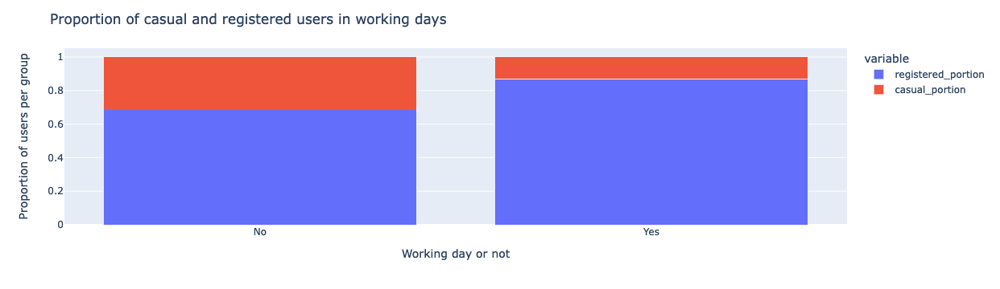

In [343]:
fig = px.bar(aggr_work, x='workingday', y=['registered_portion', 'casual_portion'], barmode="stack")
fig.update_layout(
    title='Proportion of casual and registered users in working days',
    xaxis_title = 'Working day or not',
    yaxis_title ='Proportion of users per group'
)
fig.show()

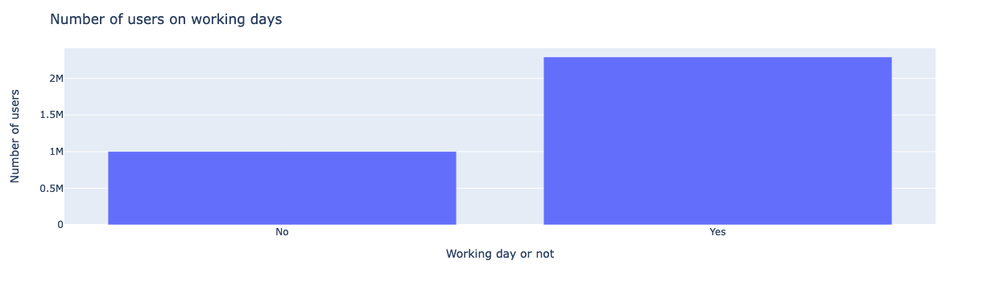

In [344]:
fig = px.bar(aggr_work, x='workingday', y='cnt')
fig.update_layout(
    title='Number of users on working days',
    xaxis_title = 'Working day or not',
    yaxis_title ='Number of users'
)
fig.show()

In [340]:
aggr_work2 = data.groupby('workingday', as_index=False).count()

In [346]:
aggr_work2['workingday'] = ['No','Yes']

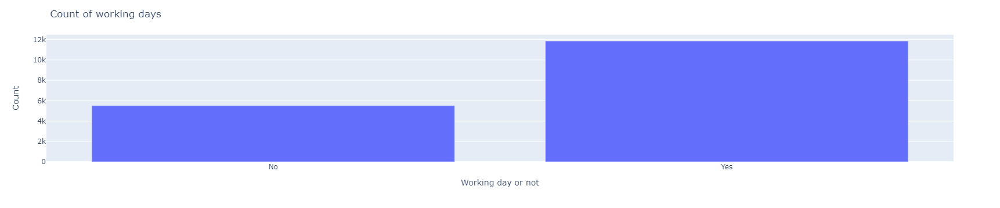

In [510]:
fig = px.bar(aggr_work2, x='workingday', y='cnt')
fig.update_layout(
    title='Count of working days',
    xaxis_title = 'Working day or not',
    yaxis_title ='Count'
)
fig.show()

### From three graphs above it is clear that working days have some influence on type of users in a day. On working days the proportion of registered users is much higher than on non working days. This could indicate that registered users use bikes for commute.

## Weather situation influence on the number of users

In [224]:
data_weather = data

In [515]:
data_weather.loc[data_weather["weathersit"] == 1, "weathersit"] = "Clear"

In [520]:
data_weather.loc[data_weather["weathersit"] == 2, "weathersit"] = "Mist"
data_weather.loc[data_weather["weathersit"] == 3, "weathersit"] = "Light precipitation"
data_weather.loc[data_weather["weathersit"] == 4, "weathersit"] = "Heavy precipitation"

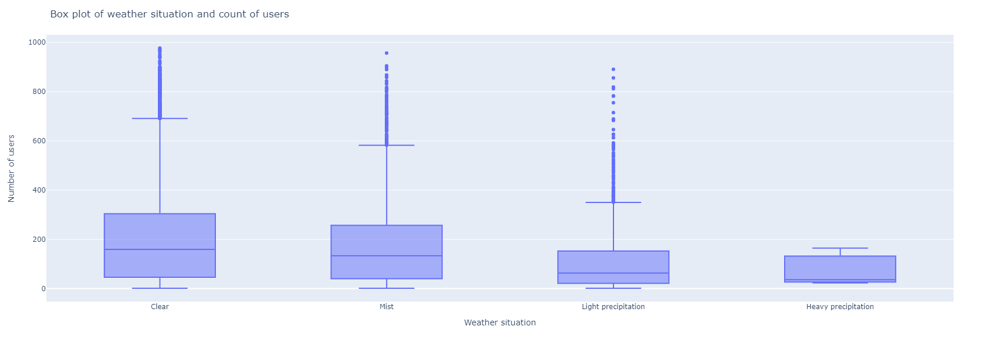

In [521]:
fig = px.box(data_weather, x="weathersit", y="cnt", height = 600, width= 800)
fig.update_layout(
    title='Box plot of weather situation and count of users',
    xaxis_title = 'Weather situation',
    yaxis_title ='Number of users'
)
fig.show()

### Weather situation feature, follows similar patter to other weather indicators. This can be noticed as the median number of users drops with worsening weather conditions.

## Analysis of correlation between variables

In [249]:
import seaborn as sns

In [250]:
df_cor = data[['hr', 'temp', 'atemp', 'weekday', 'hum', 'windspeed', 'casual', 'registered', 'cnt']].copy()

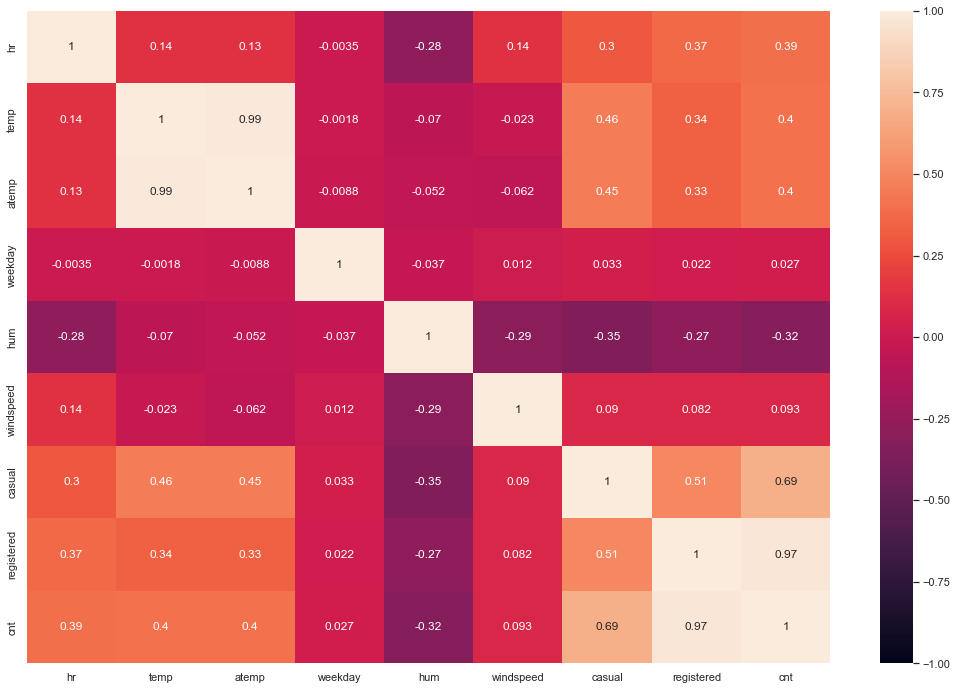

In [252]:
sns.heatmap(df_cor.corr(), vmin=-1, vmax=1, annot=True)
sns.set(rc={'figure.figsize':(18,12)})

### There are two groups of variables with strong correlation. First one is casual, registered and cnt. This makes sense as casual and registered make up cnt. In addition the model needs to predict cnt, which is made up of casual and registered, therefore those variables cannot be included in the model. Second group is temp and atemp. They have almost perfect correlation with a score of 0.99. This again makes sense as it is almost the same thing. To choose the adequate one we checked how are they correlated with cnt. The score is the same at 0.4. to solve this issue we ran to simple regression to check how well they explain the target variable.

## Testing temp and atemp variables in terms of the ability to predict target variable cnt

In [261]:
data.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,...,casual,registered,cnt,hr_str,Datetime,DayofWeek,day_time,ad_hum,ad_wind,ad_temp
dteday,,,,,,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,0,6,0,1,0.24,...,3,13,16,0:00:00,2011-01-01 00:00:00,Saturday,Night,1,1,1
2011-01-01,2,1,0,1,1,0,6,0,1,0.22,...,8,32,40,1:00:00,2011-01-01 01:00:00,Saturday,Night,1,1,1
2011-01-01,3,1,0,1,2,0,6,0,1,0.22,...,5,27,32,2:00:00,2011-01-01 02:00:00,Saturday,Night,1,1,1
2011-01-01,4,1,0,1,3,0,6,0,1,0.24,...,3,10,13,3:00:00,2011-01-01 03:00:00,Saturday,Night,1,1,1
2011-01-01,5,1,0,1,4,0,6,0,1,0.24,...,0,1,1,4:00:00,2011-01-01 04:00:00,Saturday,Night,1,1,1


In [262]:
df_test = data

In [263]:
df_test = df_test.reset_index()

In [265]:
df_test.drop(['dteday','instant','holiday', 'DayofWeek', 'casual','registered','Datetime','yr','weekday','hr_str'], axis=1, inplace=True)

In [266]:
df_test.head()

,season,mnth,hr,workingday,weathersit,temp,atemp,hum,windspeed,cnt,day_time,ad_hum,ad_wind,ad_temp
0,1,1,0,0,1,0.24,0.2879,0.81,0.0,16,Night,1,1,1
1,1,1,1,0,1,0.22,0.2727,0.80,0.0,40,Night,1,1,1
2,1,1,2,0,1,0.22,0.2727,0.80,0.0,32,Night,1,1,1
3,1,1,3,0,1,0.24,0.2879,0.75,0.0,13,Night,1,1,1
4,1,1,4,0,1,0.24,0.2879,0.75,0.0,1,Night,1,1,1


In [269]:
Xa = pd.DataFrame(df_test, columns=["atemp"])
Xt = pd.DataFrame(df_test, columns=["temp"])
ya = pd.Series(df_test['cnt'], name="Target")
yt = pd.Series(df_test['cnt'], name="Target")

In [270]:
Xa_train, Xa_test, ya_train, ya_test = train_test_split(Xa,ya, test_size=0.25)
Xt_train, Xt_test, yt_train, yt_test = train_test_split(Xt,yt, test_size=0.25)

In [271]:
from sklearn.tree import DecisionTreeRegressor

In [272]:
lr_a = DecisionTreeRegressor()
lr_t = DecisionTreeRegressor()

In [273]:
lr_a.fit(Xa_train,ya_train)
lr_t.fit(Xt_train,yt_train)

DecisionTreeRegressor()

In [274]:
acc_a = lr_a.score(Xa_test, ya_test)
acc_t = lr_t.score(Xt_test, yt_test)
print(f"R2 for atemp: {round(acc_a, 3)}. R2 for temp: {round(acc_t, 3)}")

R2 for atemp: 0.178. R2 for temp: 0.185


### Temp has managed to score slightly better than atemp, however there is some difference, therefore temp will be the variable included in the final model.

## Creating dataframes for ML models. There are three dataframes as there will be a different model to predict cnt, casual and registered

In [229]:
df = data

In [231]:
df = df.reset_index()

In [234]:
df.drop(['dteday','instant','holiday', 'DayofWeek', 'casual','registered','Datetime','yr','weekday','hr_str'], axis=1, inplace=True)

In [451]:
df.drop('atemp',axis=1,inplace=True)

In [350]:
df_c = data

In [351]:
df_c = df_c.reset_index()

In [352]:
df_c.drop(['dteday','instant','holiday', 'DayofWeek','registered','Datetime','yr','weekday','hr_str'], axis=1, inplace=True)

In [361]:
df_c.drop('cnt',axis=1,inplace=True)

In [410]:
df_c.drop('atemp',axis=1,inplace=True)

In [355]:
df_r = data

In [356]:
df_r = df_r.reset_index()

In [358]:
df_r.drop(['dteday','instant','holiday', 'DayofWeek','casual','Datetime','yr','weekday','hr_str'], axis=1, inplace=True)

In [363]:
df_r.drop('cnt',axis=1,inplace=True)

In [409]:
df_r.drop('atemp',axis=1,inplace=True)

## PART II: Prediction Model

#### It is needed to encode categorical variables before running a model

In [236]:
def day_time_enc(df):
  
    if df['day_time']=='Morning':
        return 1
    elif df['day_time']=='Afternoon':
        return 2
    elif df['day_time']=='Evening':
        return 3
    elif df['day_time']=='Night':
        return 4

In [237]:
df['day_time'] = df.apply(day_time_enc, axis=1)

In [365]:
df_c['day_time'] = df_c.apply(day_time_enc, axis=1)

In [366]:
df_r['day_time'] = df_r.apply(day_time_enc, axis=1)

#### Morning = 1, Afternoon = 2, Evening = 3, Night = 4

## There are three models. One which uses cnt as a target. And two other ones use casual and registered respectively. Our final model are the two seperate predictors. Due to differences explained at the end

### Chosen model for our predictions is Random Forest Regressor. We chose the model as it is generally very accurate, as well as performs feature selection and does not need scaling of variables. To make sure it is a good choice we run pycaret and it showed this model as second best option, which reinforced out choice.

### Target: cnt

In [118]:
from sklearn.ensemble import RandomForestRegressor

In [239]:
y = pd.Series(df['cnt'], name="Target")

In [243]:
df.drop(['cnt'], axis=1,inplace=True)

In [452]:
X = pd.DataFrame(df)

In [454]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.25)

In [455]:
regr = RandomForestRegressor()

In [377]:
param_grid = {
    'max_depth': [1,2,3,4,5,6,7,8,9,10],
    'n_estimators': [100,200,300],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [1,2,3]}

In [456]:
grid_search = GridSearchCV(estimator = regr, param_grid = param_grid, 
                          cv = 5, n_jobs = -1)

In [457]:
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 200, 300]})

In [459]:
acc = grid_search.score(X_test, y_test)
print(f"R2: {round(acc, 3)}")

R2: 0.83


In [397]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [490]:
y_test_pred = grid_search.predict(X_test)

In [493]:
mae_cnt = mean_absolute_error(y_test, y_test_pred)
print(mae_cnt)

50.24425916950392


In [494]:
mse_cnt = mean_squared_error(y_test, y_test_pred)
print(mse_cnt)

5594.451878099257


In [543]:
count = pd.DataFrame()

In [544]:
count['y_test_pred'] = y_test_pred

In [545]:
count['y_test'] = y_test

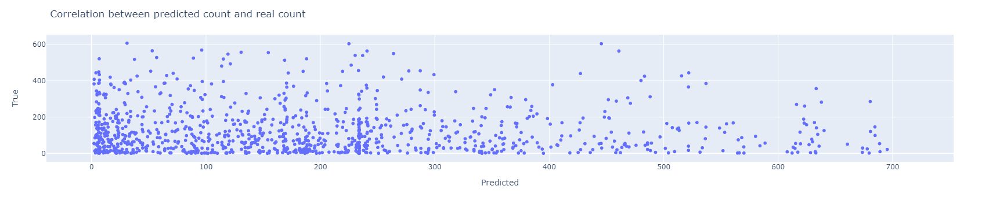

In [547]:
fig = px.scatter(count, x='y_test_pred', y='y_test')
fig.update_layout(
    title='Correlation between predicted count and real count',
    xaxis_title = 'Predicted',
    yaxis_title ='True'
)
fig.show()

### The biggest cluster of values is on the left side of the graph but with no clear patterns.

### Target: casual

In [368]:
y_c = pd.Series(df_c['casual'], name="Target")

In [369]:
df_c.drop(['casual'], axis=1,inplace=True)

In [411]:
X_c = pd.DataFrame(df_c)

In [412]:
X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(X_c,y_c, test_size=0.25)

In [413]:
reg_c = RandomForestRegressor()

In [414]:
grid_search_c = GridSearchCV(estimator = reg_c, param_grid = param_grid, 
                          cv = 5, n_jobs = -1)

In [415]:
grid_search_c.fit(X_c_train,y_c_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 200, 300]})

In [416]:
acc_reg_c = grid_search_c.score(X_c_test, y_c_test)
print(f"R2: {round(acc_reg_c, 3)}")

R2: 0.845


In [417]:
y_c_test_pred = grid_search_c.predict(X_c_test)

In [495]:
mae_c = mean_absolute_error(y_c_test, y_c_test_pred)
print(mae_c)

11.096956368990407


In [496]:
mse_c = mean_squared_error(y_c_test, y_c_test_pred)
print(mse_c)

375.6533115485754


#### Creating a seperate regression with best features to input into streamlit presentation to not have to compute gridsearch from scratch

In [435]:
grid_search_c.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 300}

In [438]:
reg_casual = RandomForestRegressor(
        max_depth=10,
        min_samples_leaf=1,
        min_samples_split=3,
        n_estimators= 300
)

In [439]:
reg_casual.fit(X_c_train,y_c_train)

RandomForestRegressor(max_depth=10, min_samples_split=3, n_estimators=300)

In [440]:
acc_reg_casual = reg_casual.score(X_c_test, y_c_test)
print(f"R2: {round(acc_reg_casual, 3)}")

R2: 0.844


In [433]:
pred_c = [{
    "season": 2,
    "mnth": 6,
    "hr": 6,
    "workingday": 1,
    "weathersit": 1,
    "temp": 30,
    "hum": 50,
    "windspeed": 10,
    "day_time": 2,
    "ad_hum": 1,
    "ad_wind": 1,
    "ad_temp": 1,
}]

pred_c = pd.DataFrame.from_dict(pred_c, orient="columns")

In [483]:
np.rint(reg_casual.predict(pred_c))

array([11.])

In [500]:
y_cas_test_pred = grid_search_c.predict(X_c_test)

In [501]:
mae_cas = mean_absolute_error(y_c_test, y_cas_test_pred)
print(mae_cas)

11.096956368990407


In [502]:
mse_cas = mean_squared_error(y_c_test, y_cas_test_pred)
print(mse_cas)

375.6533115485754


In [535]:
casual = pd.DataFrame()

In [536]:
casual['y_cas_pred'] = y_cas_test_pred

In [537]:
casual['y_c_test'] = y_c_test

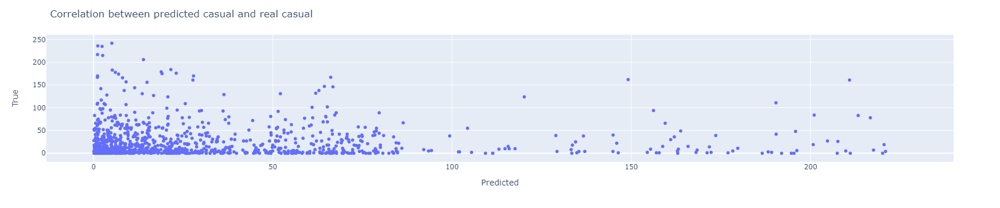

In [540]:
fig = px.scatter(casual, x='y_cas_pred', y='y_c_test')
fig.update_layout(
    title='Correlation between predicted casual and real casual',
    xaxis_title = 'Predicted',
    yaxis_title ='True'
)
fig.show()

### The prediction is mostly centered in the up to 50 rectangle. This could indicate that within that rectangle most count of casual users will fall.

### Target: registered

In [380]:
y_r = pd.Series(df_r['registered'], name="Target")

In [381]:
df_r.drop(['registered'], axis=1,inplace=True)

In [420]:
X_r = pd.DataFrame(df_r)

In [421]:
X_r_train, X_r_test, y_r_train, y_r_test = train_test_split(X_r,y_r, test_size=0.25)

In [422]:
reg_r = RandomForestRegressor()

In [423]:
grid_search_r = GridSearchCV(estimator = reg_r, param_grid = param_grid, 
                          cv = 5, n_jobs = -1)

In [424]:
grid_search_r.fit(X_r_train, y_r_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 200, 300]})

In [425]:
acc_reg_r = grid_search_r.score(X_r_test, y_r_test)
print(f"R2: {round(acc_reg_r, 3)}")

R2: 0.82


In [426]:
y_r_test_pred = grid_search_r.predict(X_r_test)

In [427]:
mean_absolute_error(y_r_test, y_r_test_pred)

42.36660040910326

In [428]:
mean_squared_error(y_r_test, y_r_test_pred)

4124.678888370429

#### Creating a seperate regression with best features to input into streamlit presentation to not have to compute gridsearch from scratch

In [441]:
grid_search_r.best_params_

{'max_depth': 10,
 'min_samples_leaf': 3,
 'min_samples_split': 2,
 'n_estimators': 200}

In [442]:
reg_registered = RandomForestRegressor(
        max_depth=10,
        min_samples_leaf=3,
        min_samples_split=2,
        n_estimators= 200
)

In [443]:
reg_registered.fit(X_r_train,y_r_train)

RandomForestRegressor(max_depth=10, min_samples_leaf=3, n_estimators=200)

In [444]:
acc_reg_registered = reg_registered.score(X_r_test, y_r_test)
print(f"R2: {round(acc_reg_registered, 3)}")

R2: 0.82


In [431]:
pred_r = [{
    "season": 2,
    "mnth": 6,
    "hr": 6,
    "workingday": 1,
    "weathersit": 1,
    "temp": 30,
    "hum": 50,
    "windspeed": 10,
    "day_time": 2,
    "ad_hum": 1,
    "ad_wind": 1,
    "ad_temp": 1,
}]

pred_r = pd.DataFrame.from_dict(pred_r, orient="columns")

In [487]:
np.rint(reg_registered.predict(pred_r))

array([119.])

In [503]:
y_reg_test_pred = reg_registered.predict(X_r_test)

In [504]:
mae_reg = mean_absolute_error(y_r_test, y_reg_test_pred)
print(mae_reg)

42.44057745680621


In [505]:
mse_reg = mean_squared_error(y_r_test, y_reg_test_pred)
print(mse_reg)

4126.01905501925


In [526]:
from sklearn.utils.validation import _check_feature_names_in

In [531]:
registered = pd.DataFrame()

In [532]:
registered['y_reg_pred'] = y_reg_test_pred

In [533]:
registered['y_r_test'] = y_r_test

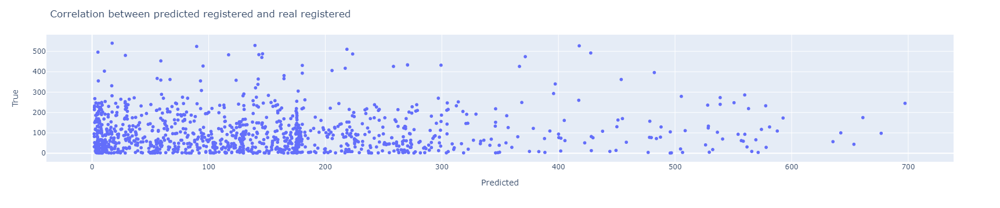

In [541]:
fig = px.scatter(registered, x='y_reg_pred', y='y_r_test')
fig.update_layout(
    title='Correlation between predicted registered and real registered',
    xaxis_title = 'Predicted',
    yaxis_title ='True'
)
fig.show()

### The prediction is mostly centered in the up to 300 rectangle. This could indicate that within that rectangle most count of registered users will fall.

## Checking combined score

In [507]:
print(mae_cnt,mse_cnt)

50.24425916950392 5594.451878099257


In [509]:
print((mae_cas+mae_reg),(mse_cas+mse_reg))

53.537533825796615 4501.6723665678255


### The compared metrics are mean absolut error and mean squared error. First score is for a model predicting total number of users and the second one are the combined scored of two seperate models predicting casual and registered users seperately. The MAE is slight larger for the two seperate models, however the MSE is significantly smaller. Additionally it makes send from a business perspective to predict the two groups seperately as they behave differently and different business actions may be taken for each.